In [1]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np
import time
from functools import partial
from google.colab import files
import glob

In [2]:
# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
VIDEOS_PATH = "/content/dataset/raw_videos"
IMAGES_PATH = "/content/dataset/images"
IMAGE_DIMS = (320, 240)
FRAME_SKIP = 1

In [4]:
# Dataset is divided into dictionaries of classes
# Each class contains contains a list of dictionaries
# Each dictionary carries the google drive URL and the time interval of interset represented as [Start time, End time] in seconds
# None for end time means until the end 

dataset = {
    "training":
    {
        "gate":[
            {"id":"1ZgB6H3BvIpY2hGlxRZyNWqxNzqXEcaOd", "time":[0, 16], "frame_skip":1},
            {"id":"1-PWKUPQN7fpccPvIP-qwHYOUG7rlIZcg", "time":[9, 19], "frame_skip":1},
            {"id":"1EC5jTVkmp8F38CekmKGOI5cozlIanap2", "time":[0, 12], "frame_skip":1}, 
            {"id":"11i-PGRHadcdM_I_Ac4eY5s1squMjwcSW", "time":[0, 17], "frame_skip":1},
            {"id":"1Pxg3wq_NI6kixxmiGrN3i8zYY6lSZtCT", "time":[12, 22], "frame_skip":1},
            {"id":"1DFxOBErILaqwLnUWnp_LAA0w6nrCestE", "time":[0, 13], "frame_skip":1},
            {"id":"1tkY7PNNUdDmEJEMwtBo1AEGre2ej7-eq", "time":[4, 16], "frame_skip":1},
            {"id":"1H31XijetfseAYMLRcrgV9zHy97jN5pjJ", "time":[6, None], "frame_skip":1},
            {"id":"1068GQ6TbXUbnnYdhEp93wEGV-gZND5Si", "time":[0, 12], "frame_skip":1},
            {"id":"1cyaXGP8Y3ew_kWOAWqY1wqvnSL7LcV-V", "time":[0, 9], "frame_skip":1},
            {"id":"18G8lNKye2jF4XA9Wp3ayulAWp9t42Lg-", "time":[0, 4], "frame_skip":1},
            {"id":"1IPJXXQGx1qaLWm21DiQ0Ykf95GeKgLEK", "time":[0, 13], "frame_skip":1},
            {"id":"1gWoRZb8TkpEi2Db9BlLYFHNQCXXQCObU", "time":[30, 41], "frame_skip":1},
            {"id":"1HsKdqkTtDqr03BHxvhrMGYrfey29HJIT", "time":[39, 44], "frame_skip":1},
            {"id":"1HsKdqkTtDqr03BHxvhrMGYrfey29HJIT", "time":[0, 12], "frame_skip":1},
            {"id":"13BU46vHAALG3vchYreWsftnibYi22jyX", "time":[5, 22], "frame_skip":1},
            {"id":"195IVlfMqHFBq9PLGVp9ULgtQSCHJZTV_", "time":[8, 13], "frame_skip":1}
            
            ],

       
    "non_gate":[
                
            {"id":"1DFxOBErILaqwLnUWnp_LAA0w6nrCestE", "time":[14, None], "frame_skip":1},
            {"id":"1tkY7PNNUdDmEJEMwtBo1AEGre2ej7-eq", "time":[22, None], "frame_skip":1},
            {"id":"1oTNF3aS3Z_UbB6DDlwWButbILlARovl9", "time":[0, 5], "frame_skip":1},
            {"id":"1npIbYXxzQ4248YWSHbiZeHTiVGtj2-qG", "time":[32, None], "frame_skip":1},
            {"id":"18G8lNKye2jF4XA9Wp3ayulAWp9t42Lg-", "time":[6, None], "frame_skip":1},
            {"id":"1y6JIdFgTv6gmXpr7wNgRq_B6CRmQZNFh", "time":[80, None], "frame_skip":1},
                ]   
    },

    "validation":
    {
        "gate":[
            {"id":"1DYceEMmv_SE-u9a2JeHDdBkE2dbLUykM", "time":[0, 16], "frame_skip":1},
            {"id":"1npIbYXxzQ4248YWSHbiZeHTiVGtj2-qG", "time":[2, 12], "frame_skip":1},
            {"id":"1HsKdqkTtDqr03BHxvhrMGYrfey29HJIT", "time":[23, 36], "frame_skip":1}
        ],
     
        "non_gate":[
            {"id":"1cyaXGP8Y3ew_kWOAWqY1wqvnSL7LcV-V", "time":[13, 17], "frame_skip":1},
            {"id":"1y6JIdFgTv6gmXpr7wNgRq_B6CRmQZNFh", "time":[20, 50], "frame_skip":1},
            {"id":"1oTNF3aS3Z_UbB6DDlwWButbILlARovl9", "time":[5, 10], "frame_skip":1}  
        ]
    },

    "testing":
    {
        "gate":[
            {"id":"1HsKdqkTtDqr03BHxvhrMGYrfey29HJIT", "time":[73, 80], "frame_skip":1},
            {"id":"1HsKdqkTtDqr03BHxvhrMGYrfey29HJIT", "time":[57, 60], "frame_skip":1},
            {"id":"13BU46vHAALG3vchYreWsftnibYi22jyX", "time":[31, 48], "frame_skip":1},
            {"id":"1y6JIdFgTv6gmXpr7wNgRq_B6CRmQZNFh", "time":[0, 8], "frame_skip":1}
        ],
     
        "non_gate":[
            {"id":"1cyaXGP8Y3ew_kWOAWqY1wqvnSL7LcV-V", "time":[13, None], "frame_skip":1},
            {"id":"1y6JIdFgTv6gmXpr7wNgRq_B6CRmQZNFh", "time":[50, 80], "frame_skip":1},
            {"id":"1oTNF3aS3Z_UbB6DDlwWButbILlARovl9", "time":[10, None], "frame_skip":1} 
        ]
    }
}

In [5]:
# Create dataset directories
os.makedirs(VIDEOS_PATH, exist_ok=True)
os.makedirs(IMAGES_PATH, exist_ok=True)

# Download files and save frames

# Loop over sets
for current_set_name, current_set in dataset.items():
  print("Processing {} set.".format(current_set_name))
  # Loop over classes
  for current_class, videos in current_set.items():
    print(" Processing {} class.".format(current_class))
    img_idx = 0
    # Create a directory for the class
    os.makedirs(os.path.join(VIDEOS_PATH, current_set_name, current_class),
                exist_ok=True)
    os.makedirs(os.path.join(IMAGES_PATH, current_set_name, current_class),
                exist_ok=True)
    os.chdir(os.path.join(VIDEOS_PATH, current_set_name, current_class))
    # Loop over videos in each class
    for index, video in enumerate(videos):
      # Download the video
      downloaded = drive.CreateFile({'id':video["id"]})
      video_name = str(index) + ".mp4"
      print("   Processing {}".format(video_name))
      downloaded.GetContentFile(video_name)
      # Open the video
      cap = cv2.VideoCapture(video_name)
      # Get the frame rate
      fps = cap.get(cv2.CAP_PROP_FPS)
      # Get start frame
      cap.set(cv2.CAP_PROP_POS_FRAMES, round(fps * video["time"][0]))
      # Get end frame
      if video["time"][1] == None:
        end_frame = cap.get(cv2.CAP_PROP_FRAME_COUNT)
      else:
        end_frame = round(fps * video["time"][1])

      frame_idx = 0

      while cap.isOpened() and cap.get(cv2.CAP_PROP_POS_FRAMES) < end_frame:
        # Read frame
        ret, frame = cap.read()
        if not ret:
          break

        if frame_idx % video["frame_skip"] == 0:
          # Save image
          cv2.imwrite(os.path.join(IMAGES_PATH, current_set_name, 
                                   current_class, str(img_idx) + ".jpg"),
                                   frame)
          img_idx += 1

        frame_idx += 1

    cap.release()

os.chdir("/content")

Processing training set.
 Processing gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4
   Processing 3.mp4
   Processing 4.mp4
   Processing 5.mp4
   Processing 6.mp4
   Processing 7.mp4
   Processing 8.mp4
   Processing 9.mp4
   Processing 10.mp4
   Processing 11.mp4
   Processing 12.mp4
   Processing 13.mp4
   Processing 14.mp4
   Processing 15.mp4
   Processing 16.mp4
 Processing non_gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4
   Processing 3.mp4
   Processing 4.mp4
   Processing 5.mp4
Processing validation set.
 Processing gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4
 Processing non_gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4
Processing testing set.
 Processing gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4
   Processing 3.mp4
 Processing non_gate class.
   Processing 0.mp4
   Processing 1.mp4
   Processing 2.mp4


In [6]:
# Number of images of each class
dataset_size = {}
for current_set_name, current_set in dataset.items():
  print("{} set:".format(current_set_name))
  dataset_size[current_set_name] = 0
  for current_class, _ in current_set.items():
    num_imgs = len(os.listdir(os.path.join(IMAGES_PATH, current_set_name,
                                           current_class)))
    dataset_size[current_set_name] += num_imgs
    print(" {} {} class images.".format(num_imgs, current_class))
  print(" Total {} dataset size = {}".format(current_set_name,
                                             dataset_size[current_set_name]))

training set:
 2431 gate class images.
 3022 non_gate class images.
 Total training dataset size = 5453
validation set:
 575 gate class images.
 935 non_gate class images.
 Total validation dataset size = 1510
testing set:
 840 gate class images.
 1049 non_gate class images.
 Total testing dataset size = 1889


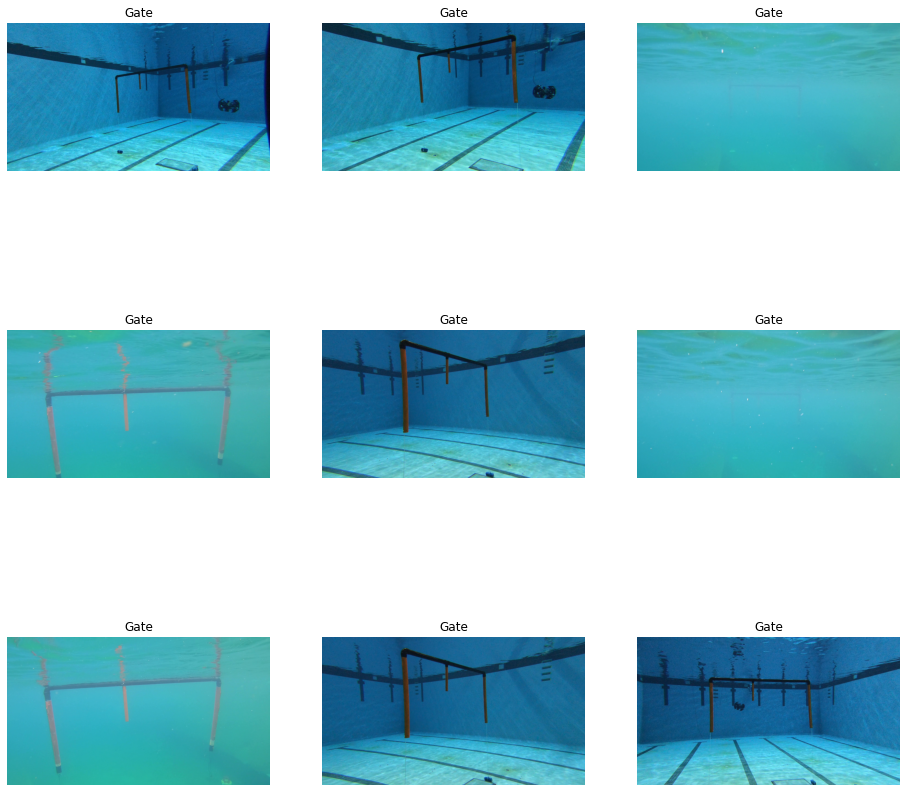

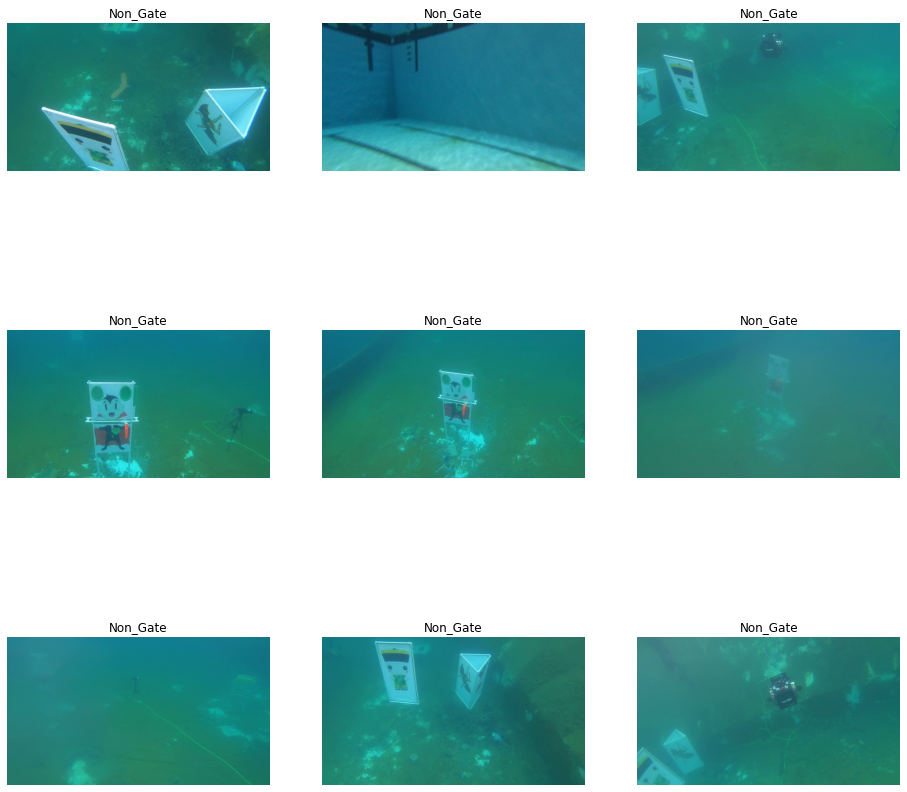

In [7]:
# Sample images from each class in training set
n_columns = 3
n_rows = 3
for current_class, _ in dataset["training"].items():  
  num_imgs = len(os.listdir(os.path.join(IMAGES_PATH, "training",
                                          current_class)))
  fig = plt.figure(figsize=(16, 16))
  rnd_idx = np.random.randint(0, num_imgs - 1, n_columns * n_rows)
  for i in range(n_columns * n_rows):
    img = plt.imread(os.path.join(IMAGES_PATH, "training",
                                  current_class, str(rnd_idx[i]) + ".jpg"))
    fig.add_subplot(n_rows, n_columns, i + 1)
    plt.imshow(img)
    plt.title(current_class.title())
    plt.axis('off')

In [8]:
import tensorflow as tf
from tensorflow import keras

In [9]:
class_names = list(dataset["training"].keys())
num_classes = len(class_names)
BATCH_SIZE = 32
EPOCHS = 10

In [10]:
train_dataset = keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(IMAGES_PATH, "training"),
    labels="inferred",
    label_mode="binary" if (num_classes == 2) else 'categorical',
    class_names=class_names,
    color_mode="rgb",
    image_size=IMAGE_DIMS[::-1],
    shuffle=True,
    batch_size=BATCH_SIZE
)

valid_dataset = keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(IMAGES_PATH, "validation"),
    labels="inferred",
    label_mode="binary" if (num_classes == 2) else 'categorical',
    class_names=class_names,
    color_mode="rgb",
    image_size=IMAGE_DIMS[::-1],
    shuffle=True,
    batch_size=BATCH_SIZE
)

test_dataset = keras.preprocessing.image_dataset_from_directory(
    directory=os.path.join(IMAGES_PATH, "testing"),
    labels="inferred",
    label_mode="binary" if (num_classes == 2) else 'categorical',
    class_names=class_names,
    color_mode="rgb",
    image_size=IMAGE_DIMS[::-1],
    shuffle=True,
    batch_size=BATCH_SIZE
)

Found 5453 files belonging to 2 classes.
Found 1510 files belonging to 2 classes.
Found 1889 files belonging to 2 classes.


In [11]:
def preprocess(images, labels, data_augmentation=False):
  
  if data_augmentation:
    # Randomly flip the image horizontaly
    images = keras.layers.Lambda(
        lambda image: tf.image.random_flip_left_right(image))(images)
    """
    # Randomly adjust the saturation
    
    images = keras.layers.Lambda(
        lambda image: tf.image.random_saturation(image, 0, 10))(images)
    
    """
    # Randomly adjust the brightness
    images = keras.layers.Lambda(
        lambda image: tf.image.random_brightness(image, 10))(images)

  
  # Normalize images
  images = keras.layers.Lambda(lambda image: image/255.0)(images)
  return (images, labels)

In [12]:
# Preprocess the data
train_dataset = train_dataset.repeat(2).map(
                    partial(preprocess, data_augmentation=True)).prefetch(1)
valid_dataset = valid_dataset.map(
                    partial(preprocess, data_augmentation=False)).prefetch(1)
test_dataset = valid_dataset.map(
                    partial(preprocess, data_augmentation=False)).prefetch(1)

In [13]:
class AUVClassificationModel(keras.models.Model):
  def __init__(self, num_classes, **kwargs):
    super().__init__(**kwargs)
    self.num_classes = num_classes

    # Convolutional layers
    self.conv_1 = keras.layers.Conv2D(filters=16,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    self.conv_2 = keras.layers.Conv2D(filters=32,
                                      kernel_size=(3, 3),
                                      strides=(1, 1),
                                      padding="valid")
    
    # Pooling layers
    self.pool_1 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    self.pool_2 = keras.layers.MaxPool2D(pool_size=(2, 2),
                                         strides=(2, 2),
                                         padding='valid')
    
    
    # Batch Normalization layers.
    self.batch_norm_1 = keras.layers.BatchNormalization()
    self.batch_norm_2 = keras.layers.BatchNormalization()

    # Dropout layers
    self.dropout_1 = keras.layers.Dropout(0.5)
    self.dropout_2 = keras.layers.Dropout(0.25)

    # Activation layers
    self.activation_1 = keras.layers.Activation('relu')
    self.activation_2 = keras.layers.Activation('relu')

    # Flatten layer
    self.flatten_1 = keras.layers.Flatten()

    # Dense layers.
    self.dense_1 = keras.layers.Dense(units=64,
                                      activation='relu')
    
    
    self.dense_2 = keras.layers.Dense(units=self.num_classes,
                                      activation="softmax")
    

  def call(self, inputs):
    # First Layer
    inputs = self.conv_1(inputs)
    inputs = self.batch_norm_1(inputs)
    inputs = self.dropout_1(inputs)
    inputs = self.activation_1(inputs)
    inputs = self.pool_1(inputs)

    # Second Layer
    inputs = self.conv_2(inputs)
    inputs = self.batch_norm_2(inputs)
    inputs = self.dropout_2(inputs)
    inputs = self.activation_2(inputs)
    inputs = self.pool_2(inputs)

    inputs = self.flatten_1(inputs)

    # Third layer
    inputs = self.dense_1(inputs)

    # Output layer
    inputs = self.dense_2(inputs)

    return inputs

In [14]:
# Create the model
model = AUVClassificationModel(num_classes)

In [15]:
# Compile the model
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [16]:
def exponential_decay(lr0, s):
  def exponential_decay_fn(epoch):
    return lr0 * 0.1**(epoch / s)
  return exponential_decay_fn

exponential_decay_fn = exponential_decay(lr0=0.01, s=10)

In [17]:
root_logdir = os.path.join(os.curdir, "my_logs")

def get_run_logdir():
  run_id = time.strftime("run_%Y_%m_%d-%H_%M_%S")
  return os.path.join(root_logdir, run_id)

run_logdir = get_run_logdir()

In [18]:
# Fit the model
callbacks = [keras.callbacks.EarlyStopping(min_delta=0.01, patience=2),
             keras.callbacks.ModelCheckpoint("model_checkpoint",
                                             save_best_only=True),
             keras.callbacks.TensorBoard(run_logdir),
             keras.callbacks.LearningRateScheduler(exponential_decay_fn)]
             
history = model.fit(train_dataset,
                    validation_data=valid_dataset,
                    callbacks=callbacks,
                    epochs=EPOCHS)

Epoch 1/10
  1/342 [..............................] - ETA: 0s - loss: 1.0326 - accuracy: 0.4688WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.
342/342 [==============================] - 153s 447ms/step - loss: 14.7540 - accuracy: 0.9692 - val_loss: 0.5664 - val_accuracy: 0.9404
Epoch 2/10
342/342 [==============================] - 143s 419ms/step - loss: 0.0355 - accuracy: 0.9975 - val_loss: 1.6172 - val_accuracy: 0.8053
Epoch 3/10
342/342 [==============================] - 141s 414ms/step - loss: 0.0192 - accuracy: 0.9971 - val_loss: 0.2346 - val_accuracy: 0.9444
Epoch 4/10
342/342 [==============================] - 141s 413ms/step - loss: 0.0021 - accuracy: 0.9997 - val_loss: 0.1092 - val_accuracy: 0.9596
Epoch 5/10
342/342 [==============================] -

In [19]:
%load_ext tensorboard
%tensorboard --logdir=./my_logs --port=6006

<IPython.core.display.Javascript object>

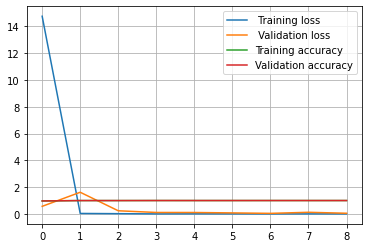

In [20]:
plt.plot(history.history["loss"], label=" Training loss")
plt.plot(history.history["val_loss"], label=" Validation loss")
plt.plot(history.history["accuracy"], label="Training accuracy")
plt.plot(history.history["accuracy"], label="Validation accuracy")
plt.legend()
plt.grid()

In [21]:
# Load the best model
model.load_weights("model_checkpoint")

In [22]:
model.summary()

Model: "auv_classification_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              multiple                  448       
_________________________________________________________________
conv2d_1 (Conv2D)            multiple                  4640      
_________________________________________________________________
max_pooling2d (MaxPooling2D) multiple                  0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 multiple                  0         
_________________________________________________________________
batch_normalization (BatchNo multiple                  64        
_________________________________________________________________
batch_normalization_1 (Batch multiple                  128       
_________________________________________________________________
dropout (Dropout)            multiple     

In [23]:
model.save("saved_model")

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: saved_model/assets


In [24]:
!zip -r GateDetection_NeuralNetwork.zip saved_model

  adding: saved_model/ (stored 0%)
  adding: saved_model/variables/ (stored 0%)
  adding: saved_model/variables/variables.data-00000-of-00001 (deflated 31%)
  adding: saved_model/variables/variables.index (deflated 67%)
  adding: saved_model/assets/ (stored 0%)
  adding: saved_model/saved_model.pb (deflated 89%)


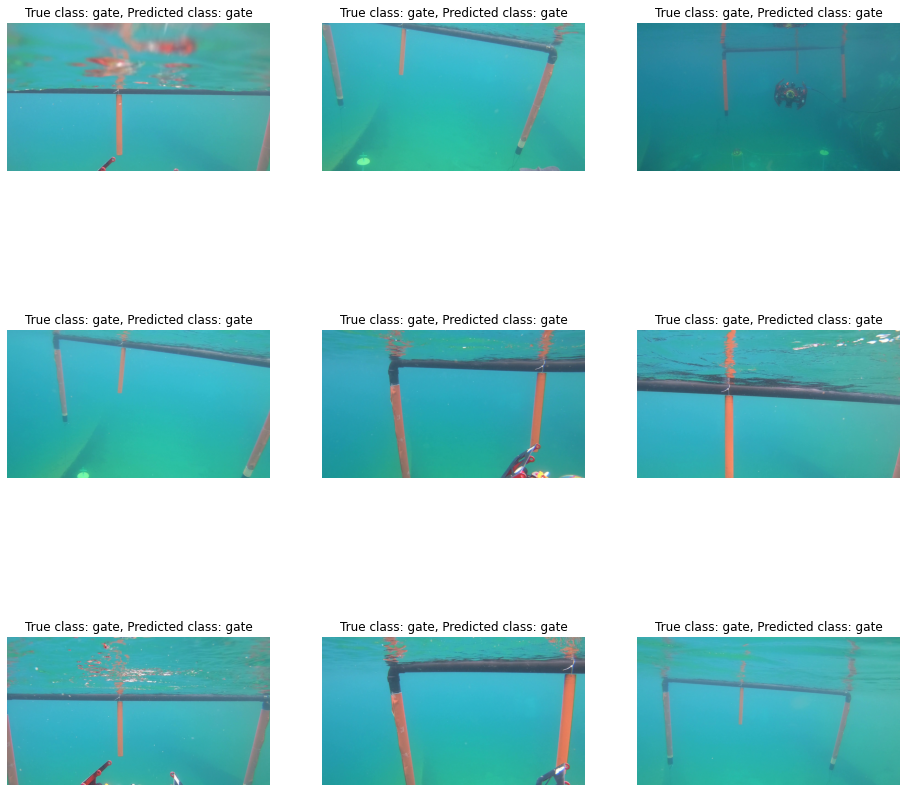

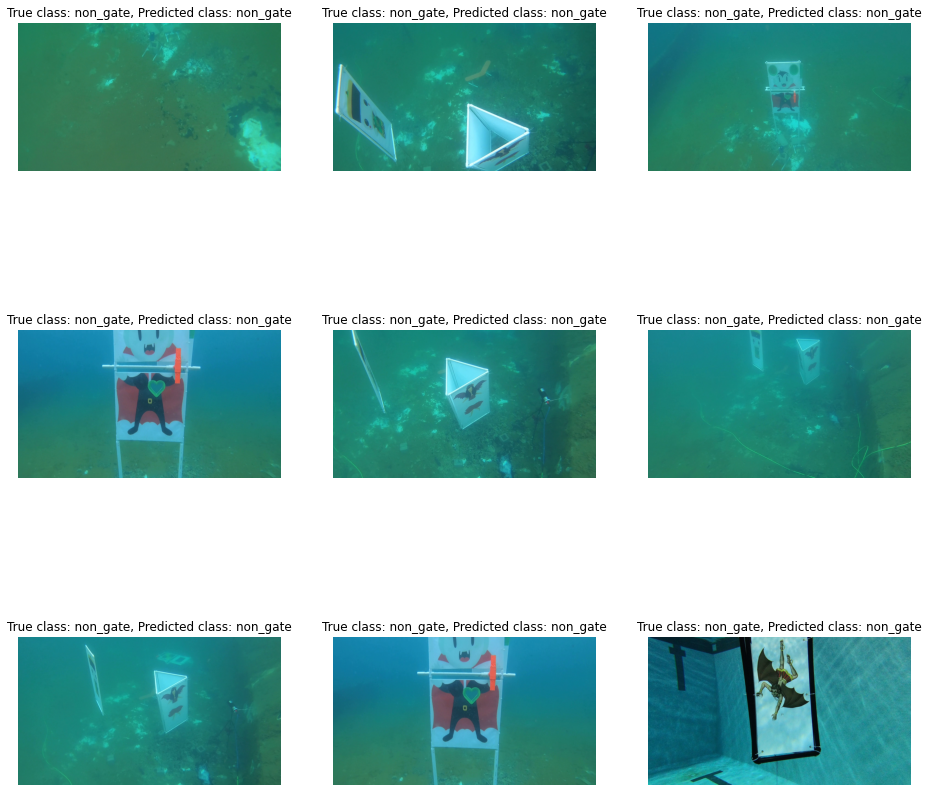

In [25]:
# Sample prediction on testing set
n_columns = 3
n_rows = 3
for current_class, _ in dataset["testing"].items():  
  num_imgs = len(os.listdir(os.path.join(IMAGES_PATH,
                                          "testing", current_class)))
  fig = plt.figure(figsize=(16, 16))
  rnd_idx = np.random.randint(0, num_imgs - 1, n_columns * n_rows)
  for i in range(n_columns * n_rows):
    img = plt.imread(os.path.join(IMAGES_PATH, "testing", 
                                  current_class, str(rnd_idx[i]) + ".jpg"))
    fig.add_subplot(n_rows, n_columns, i + 1)
    plt.imshow(img)
    # Resize the image
    img = cv2.resize(img, IMAGE_DIMS, interpolation =cv2.INTER_AREA)
    # Add a dimension
    img = np.expand_dims(img, axis=0)
    # Normalize the image
    img = img.astype(np.float32) / 255.0
    prediction = model.predict(img)
    prediction = np.argmax(prediction, axis=-1)
    plt.title("True class: {}, Predicted class: {}".format(current_class,
                                                  class_names[prediction[0]]))
    plt.axis('off')

In [26]:
# Create testing data directory
os.makedirs(os.path.join(IMAGES_PATH, "testing"), exist_ok=True)
# Change current path to testing data directory
os.chdir(os.path.join(IMAGES_PATH, "testing"))

Saving test.jpg to test.jpg


(-0.5, 1200.5, 647.5, -0.5)

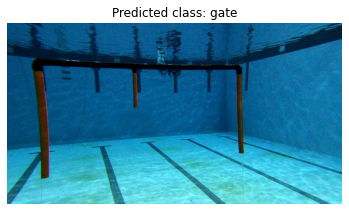

In [28]:
# Upload test image
uploaded = files.upload()
# Get the latest uploaded file
latest_file = max(glob.glob(os.path.join(IMAGES_PATH, "testing", '*')),
                  key=os.path.getctime)
# Read the image
img = plt.imread(latest_file)
# Display the image
plt.imshow(img)
# Resize the image
img = cv2.resize(img, IMAGE_DIMS, interpolation =cv2.INTER_AREA)
# Add a dimension
img = np.expand_dims(img, axis=0)
# Normalize the image
img = img.astype(np.float32) / 255.0
# Make prediction
prediction = model.predict(img)
prediction = np.argmax(prediction, axis=-1)
plt.title("Predicted class: {}".format(class_names[prediction[0]]))
plt.axis('off')